In [ ]:
import webbrowser

#webbrowser.open('https://data.sdss.org/datamodel/files/APOGEE_ASTRONN/apogee_astronn.html') 

webbrowser.open('https://www.sdss.org/dr17/irspec/targets/special-programs/')

webbrowser.open('https://www.sdss.org/dr17/irspec/targets/')

webbrowser.open('https://www.sdss.org/dr17/irspec/spectro_data/')

webbrowser.open('https://www.sdss.org/wp-content/uploads/2014/08/apogee_tempsequence_new2.png')

webbrowser.open('https://www.sdss.org/press-releases/untangling-the-streamers-in-the-milky-way/')

webbrowser.open('https://ui.adsabs.harvard.edu/abs/2021ApJ...913...39S/abstract')

webbrowser.open('https://data.sdss.org/datamodel/files/APOGEE_ASPCAP/APRED_VERS/ASPCAP_VERS/allStar.html')

webbrowser.open('https://www.sdss.org/dr17/irspec/abundances/')

webbrowser.open('https://www.sdss.org/dr17/data_access/value-added-catalogs/?vac_id=the-astronn-catalog-of-abundances,-distances,-and-ages-for-apogee-dr17-stars')

In [ ]:
from IPython.display import display, HTML
display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))

In [1]:
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import scipy as sp

import seaborn as sns 

import ipyaladin.aladin_widget as ipyal

In [4]:
import ipyaladin

print(ipyaladin.__version__)

0.2.1


In [5]:
import warnings
import sys

if not sys.warnoptions:
    warnings.simplefilter("ignore")

In [ ]:
"""from http.client import BAD_REQUEST
import sys

import sklearn

from scipy.fftpack import fft
print(sys.executable)

import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")""";

In [ ]:
"""import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np

import pandas as pd

import scipy as sp

from scipy import *

import seaborn as sns 
#from mpl_toolkits import mplot3d
from scipy.stats import gaussian_kde

import ipywidgets as widgets

import ipyaladin.aladin_widget as ipyal

import plotly.express as px


print("\nInitialize!")""";

In [6]:
Ipython_default = plt.rcParams.copy()

# reset rcParams
#plt.rcParams.update(Ipython_default)

#plt.style.use('dark_background')

#print("Backup default plot background. \nSet Dark background.")

In [7]:
pd.options.display.max_columns = None
pd.set_option('display.max_rows', 2000)

#df_Apogee.columns.sort_values().tolist()

In [8]:
df_Apogee = []

field = ""

unique_fields = []

In [9]:
def Plot002(f1, field):
    plt.style.use('dark_background')
    s0 = f1[f1['LOGG'] > 0]
    s1 = s0[s0['GAIAEDR3_PHOT_G_MEAN_MAG'] > -9999]
    ff1 = s1[(s1['BP_RP'] > -9999) & (s1['BP_RP'] < 9999)]
    BA1 = ff1[ff1['ASPCAP_GRID'].isin(['BA'])]
    Fd1 = ff1[ff1['ASPCAP_GRID'].isin(['Fd_a', 'Fd_b', 'Fd_c', 'Fd_d'])]
    GKd1 = ff1[ff1['ASPCAP_GRID'].isin(['GKd_a', 'GKd_b', 'GKd_c', 'GKd_d'])]
    GKg1 = ff1[ff1['ASPCAP_GRID'].isin(['GKg_a', 'GKg_b', 'GKg_c', 'GKg_d'])]
    Md1 = ff1[ff1['ASPCAP_GRID'].isin(['Md_a', 'Md_b', 'Md_c', 'Md_d'])]
    Mg1 = ff1[ff1['ASPCAP_GRID'].isin(['Mg_a', 'Mg_b', 'Mg_c', 'Mg_d'])]
    s1Label = "TEFF"
    fig = plt.figure(figsize=(6, 5))
    plt.subplot(111)
    if BA1.shape[0] > 0:
        plt.scatter(BA1['BP_RP'], BA1['M'], label=('BA stars: ' + str(BA1.shape[0])), marker='o', linewidth=0,s=20,c='violet')
    plt.scatter(Fd1['BP_RP'], Fd1['M'], label=('Fd stars: ' + str(Fd1.shape[0])), marker='o', linewidth=0,s=8,c='b')
    plt.scatter(GKd1['BP_RP'], GKd1['M'], label=('GKd stars: ' + str(GKd1.shape[0])), marker='o', linewidth=0,s=8,c='g')
    plt.scatter(GKg1['BP_RP'], GKg1['M'], label=('GKg stars: ' + str(GKg1.shape[0])), marker='o', linewidth=0,s=8,c='orange')
    plt.scatter(Mg1['BP_RP'], Mg1['M'], label=('Mg stars: ' + str(Mg1.shape[0])), marker='o', linewidth=0,s=8,c='r')
    if Md1.shape[0] > 0:
        plt.scatter(Md1['BP_RP'], Md1['M'], label=('Md stars: ' + str(Md1.shape[0])), marker='o', linewidth=0,s=8,c='aqua')
    ax = plt.gca()
    plt.gca().invert_yaxis()
    plt.xlabel('BP_RP', fontsize=10)
    plt.ylabel('Absolute Magnitude', fontsize=10)
    plt.xticks(size = 10)
    plt.yticks(size = 10)
    plt.grid(False)
    plt.legend(fontsize=10)
    plt.title(str(field) + '\nHertzsprung-Russel Diagram', fontsize=10)
    plt.show()

In [10]:
def scatter_2D(x, y, fig=None, ax=None, c='k', s=2.5, *args, **kwargs):
    
    if (fig or ax) is None:
        fig, ax = plt.subplots()
    
    plot = ax.scatter(x, y, c=c, s=s, *args, **kwargs)
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.tick_params(left=True, bottom=True,
                   labelleft=True, labelbottom=True)

In [11]:
def Ra_Dec(field):
    f1 = df_Apogee[df_Apogee['FIELD'] == field]
    RA1 = str(f1.RA.median())
    DEC1 = str(f1.DEC.median())
    ra_dec = str(RA1) + " " + str(DEC1)
    return((ra_dec))

In [12]:
def Plot_HR_Diagram(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):
            scatter_2D(df2['BP_RP'], df2['M'], ax=ax, 
                    c=df2['BP_RP'], cmap='RdYlBu_r',)

            ax.set(title='Field: {}    Stars: [{}]'.format(label, len(df2)), 
                xlabel='Color index $(bp_rp)$', 
                ylabel='Absolute Magnitude $M$', 
                xlim=(xmin,xmax), ylim=(ymax,ymin))
                
            ax.set_title(str(label), fontsize=25)
            ax.set_xlabel('Color index', fontsize=25)
            ax.set_ylabel(None)
            ax.grid(None)
            
    
    plt.show()

In [13]:
def HR_Details(fields_list):
    for i in range(1, len(fields_list) + 1):
        field = fields_list[i-1]
        f1 = df_Apogee[df_Apogee['FIELD'] == field]
        Plot002(f1, field)

In [14]:
def Plot_Feh(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):

            ff1 = df2[df2['FE_H'] > -9999]

            ff0 = ff1[ff1.LOGG > -9999]
            
            sns.set()
            plt.style.use('dark_background')

            s0 = ff1
            rbins = np.linspace(-3,1,50)

            ax.hist(s0.FE_H, bins=rbins,histtype='step',linewidth=2, color='r')
            ax.set_title(str(label), fontsize=25)
            ax.set_xlabel('FeH', fontsize=25)
            ax.set_ylabel(None)
            ax.grid(None)
    plt.show()

In [15]:
def Plot_LogG(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):

            ff1 = df2[df2['LOGG'] > -9999]

            ff0 = ff1[ff1.LOGG > -9999]
            
            sns.set()
            plt.style.use('dark_background')

            s0 = ff1
            rbins = np.linspace(0,6,50)
            
            ax.hist(s0.LOGG, bins=rbins,histtype='step',linewidth=2, color='g')
            ax.set_title(str(label), fontsize=25)
            ax.set_xlabel('LogG', fontsize=25)
            ax.set_ylabel(None)
            ax.grid(None)
    plt.show()

In [16]:
def Plot_Age(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):

            ff1 = df2[df2['LOGG'] > -9999]

            ff0 = ff1[ff1.LOGG > -9999]
            
            sns.set()
            plt.style.use('dark_background')

            s0 = ff1
            rbins = np.linspace(0,14,50)
            ax.hist(s0.age, bins=rbins,histtype='step',linewidth=2, color='orange')
            ax.set_title(str(label), fontsize=25)
            ax.set_xlabel('Age', fontsize=25)
            ax.set_ylabel(None)
            ax.grid(None)
    plt.show()

In [17]:
def Plot_Distance(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):

            ff1 = df2[df2['LOGG'] > -9999]

            ff0 = ff1[ff1.LOGG > -9999]
            
            sns.set()
            plt.style.use('dark_background')

            s0 = ff1
            rbins = np.linspace(xmin,xmax,50)
            
            ax.hist(s0.Kpc, bins=rbins,histtype='step',linewidth=2, color='b')
            ax.set_title(str(label), fontsize=25)
            ax.set_xlabel('Distance [kpc]', fontsize=25)
            ax.set_ylabel(None)
            ax.grid(None)
           
    plt.show()

In [18]:
def Plot_Alpha_Elements(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):

            ff1 = df2[df2['LOGG'] > -9999]

            ff0 = ff1[ff1.LOGG > -9999]
            
            sns.set()
            plt.style.use('dark_background')

            s0 = ff1
            rbins = np.linspace(-0.5,0.5,50)
    
            ax.hist(s0.ALPHA_M, bins=rbins,histtype='step',linewidth=2, color='r')
            ax.set_title(str(label), fontsize=25)
            ax.set_xlabel('Alpha Elements', fontsize=25)
            ax.set_ylabel(None)
            ax.grid(None)
            
    plt.show()

In [19]:
def panel_plot(f1, label, xmin, xmax, ymin,  ymax):

    sns.set_style('white')
    #cm = plt.cm

    fig = plt.figure(figsize=(25,4))

    s0 = f1[f1['GAIAEDR3_PMRA'] > -9999]
    s1 = s0[s0['GAIAEDR3_PHOT_G_MEAN_MAG'] > -9999]
    ff1 = s1[(s1['BP_RP'] > -9999) & (s1['BP_RP'] < 9999)]
    
    if ff1.shape[0] > 10:
    
        ax1 = fig.add_subplot(141)
        sns.set_style('darkgrid')
        image = ax1.scatter(ff1['RA'], ff1['DEC'], label=label, marker='.', linewidth=0,
        c=ff1.LOGG,edgecolor='k',cmap="jet")
        ax1.set_xlabel('RA', fontsize=12)
        ax1.set_ylabel('DEC', fontsize=12)
        ax1.set_title(str(label) + "  \nAverage LogG: " + str(round(ff1.LOGG.mean(),2)), fontsize=12)
        bar = fig.colorbar(image,orientation="vertical",pad=0.01)
        bar.set_label("LogG",size=12)

        ax2 = fig.add_subplot(142)
        sns.set_style('white')
        sns.set(font_scale = 0.8)
        labels = ['AL_FE','CA_FE','CE_FE','CI_FE','CO_FE','CR_FE','C_FE','K_FE','MG_FE','MN_FE','NA_FE','NI_FE','N_FE','O_FE','SI_FE','S_FE','TIII_FE','TI_FE','V_FE','ALPHA_M']
        corr=ff1[['AL_FE','CA_FE','CE_FE','CI_FE','CO_FE','CR_FE','C_FE','K_FE','MG_FE','MN_FE','NA_FE','NI_FE','N_FE','O_FE','SI_FE','S_FE','TIII_FE','TI_FE','V_FE','ALPHA_M']].corr()
        mask = np.zeros_like(corr)
        triangle_indices = np.triu_indices_from(mask)
        mask[triangle_indices] = True
        cmap = sns.diverging_palette(230, 20, as_cmap=True)
        heatmap = sns.heatmap(corr, mask=mask, annot=True, annot_kws={"size": 6}, cmap = cmap)
        heatmap.set_title(str(label) + " Correlation Heatmap\nStars: " + str(ff1.shape[0]))
        heatmap.set_xticklabels(labels, size = 8)
        heatmap.set_yticklabels(labels, size = 8)

        # A quiver plot (spatial plot with arrows that describe each object's proper motion)
        ax3 = fig.add_subplot(143)
        sns.set_style('white')
        #ax3.quiver(ff1.RA, ff1.DEC, ff1.GAIAEDR3_PMRA, ff1.GAIAEDR3_PMDEC, 0)
        ax3.quiver(ff1.RA, ff1.DEC, ff1.GAIAEDR3_PMRA, ff1.GAIAEDR3_PMDEC, color='r')
        ax3.set_title(str(label) + " Proper Motions",fontsize=10)
        ax3.set_xlabel("Right Ascension",fontsize=10)
        ax3.set_ylabel("Declination",fontsize=10)
    

        ax4 = fig.add_subplot(144)
        #Plot_VHELIO_AVG(ff1, field)
        sns.set_style('darkgrid')
        image = ax4.scatter(ff1['RA'], ff1['DEC'], label=label, marker='.', linewidth=0,
        c=ff1.VHELIO_AVG,edgecolor='k',cmap="jet_r")
        ax4.set_xlabel('RA', fontsize=12)
        ax4.set_ylabel('DEC', fontsize=12)
        ax4.set_title(str(label) + "  \nVHELIO_AVG", fontsize=12)
        bar = fig.colorbar(image,orientation="vertical",pad=0.01)
        bar.set_label("VHELIO_AVG",size=12)

        plt.show()

In [20]:
def Plot_Proper_Motion(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    #sptype_list = fields_list[0:10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()
    #with plt.style.context('dark_background'):

    #fig, axs = plt.subplots(2, figsize=(50,6))
    #for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):
    for df2, label in zip(sptype_len_list, sptype_list):

        #Plot_Rows_Lims(fields_list,-0.5, 4.5, -5, 13)
        panel_plot(df2, label, xmin, xmax, ymin, ymax)

    plt.show()

In [21]:
def AbundanceCategories(x1, field):
    main_sequence = x1[x1['LOGG'].astype(float) > 4.20]
    turnoff       = x1[(x1['LOGG'].astype(float) < 4.20) & (x1['LOGG'].astype(float) > 3.90)]
    subgiants     = x1[(x1['LOGG'].astype(float) < 3.90) & (x1['LOGG'].astype(float) > 3.60)]
    red_giants    = x1[x1['LOGG'].astype(float) < 3.60]

    print("\nField: " + str(field))
    
    print("main_sequence: " + str(main_sequence.shape[0]))
    print("turnoff: " + str(turnoff.shape[0]))
    print("subgiants: " + str(subgiants.shape[0]))
    print("red_giants: " + str(red_giants.shape[0]))

### Select a target by un-commenting the df_Apogee target of interest and comment out any other selected targets

In [ ]:
"""
Globular Clusters
https://www.sdss.org/dr16/irspec/targets/

Globular cluster stars from APOGEE were selected independently 
for each system using the following priority scheme:
1. Known members based on chemical abundances and stellar parameters 
   determined from prior spectroscopic information ( apogee2_target2 =2 and 10)
2. Candidates selected with radial velocities (apogee2_target2=10)
3. Candidates selected with proper motions (apogee2_target2=10)
4. Photometric candidates

Targeted Globular Clusters:

Survey ComponentCluster Names

APOGEE-1
NGC4147, M53, M3, NGC5466, NGC5634, M5, M107, M13, NGC6229, M92, NGC6715, M15, M2

APOGEE-2N
M12, M15, M71, M5

APOGEE-2S
47 Tucanae, M10, M12, M22, M4, M55, M68, M79, NGC1851, NGC2808, NGC288, 
NGC3201, NGC362, NGC6388, NGC6397, NGC6441, NGC6752, Omega Centauri

APOGEE-2 designs belonging to globular cluster fields have PROGRAMNAME 
tag value “cluster_gc”, “cluster_gc1”, “cluster_gc2”, or “cluster_gc3”.

Globular cluster candidates may not be flagged appropriately in DR16.
""";

gc1 = pd.read_csv('cluster_gc,apogee.csv')
gc2 = pd.read_csv('cluster_gc,cluster_gc1.csv')
gc3 = pd.read_csv('cluster_gc.csv')
gc4 = pd.read_csv('cluster_gc1.csv')
gc5 = pd.read_csv('cluster_gc2,cluster_gc1.csv')
gc6 = pd.read_csv('cluster_gc2.csv')
gc7 = pd.read_csv('clusters_gc1.csv')
gc8 = pd.read_csv('clusters_gc2.csv')
gc9 = pd.read_csv('clusters_gc3.csv')

#df_Apogee = pd.concat([gc1, gc2, gc3, gc4, gc5, gc6, gc7, gc8, gc9], ignore_index=True, sort=False)


In [ ]:
"""
Bulge
https://www.sdss.org/dr16/irspec/targets/

All APOGEE-1 bulge stars were selected using a single color limit of 
(J−Ks)0 ≥0.5 mag. For APOGEE-1 targets, bulge fields were selected in 
the galactic region 357∘ ≤ l ≤ 22∘, |b|≤ 16∘, 
while for APOGEE-2 the bulge region corresponds to 340∘  ≤l≤ 20∘, |b| ≤ 25∘.
All APOGEE-1 bulge fields had one visit, with a faint magnitude limit of H=11 mag. 
Given that the Galactic bulge reaches much higher altitudes in the southern hemisphere, 
all APOGEE-2 bulge fields were observed as part of APOGEE-2S. 
These fields have a faint magnitude limit of either H=12.2 mag or H=12.8 mag. 
Fields designed to a H=12.2 mag depth were scheduled for three total visits 
following the standard magnitude visits relation. 
Due to an underestimation of the time that it would require to complete the 
bulge APOGEE-2S plan, cohorts in H=12.8 mag depth bulge fields are not always 
scheduled for the total number of visits required to reach
 a signal-to-noise of 100. In any case, a lower limit of signal-to-noise of ~80 is guaranteed 
 for all APOGEE-2S bulge fields given the number of visits assigned to each cohort. 
 All APOGEE-2 designs from bulge fields have the PROGRAMNAME “bulge”.
""";

#df_Apogee = pd.read_csv('bulge.csv')

In [ ]:
""" 
Calibration 

""";

cal1 = pd.read_csv('cal_btx.csv')
cal2 = pd.read_csv('eb_btx.csv')

#df_Apogee = pd.concat([cal1, cal2], ignore_index=True, sort=False)

In [ ]:
"""
TESS N-CVZ
https://www.sdss.org/dr16/irspec/targets/


As part of the Bright Time Extension, 
a program was initiatied to study the Northern Continuous Viewing Zone for the TESS satellite. 

The fields are called "CVZ_*_btx" and have PROGRAMNAME "cvz_btx."

Targets were selected with a multi-tier priority scheme that prioritized 
rare targets over more common targets. 

All targets were selected from the TESS Input Catalog (TIC). 

The targeting is documented in APOGEE2_TARGET2 as follows:

- bit 27 APOGEE2_CVZ_AS4_OBAF: OBAF stars
- bit 28 APOGEE2_CVZ_AS4_GI: targets in 
  Guest Investigator programs such as planet hosts, 
  Astroseismic Target List, Subgiants, and Cool-dwarfs
- bit 29 APOGEE2_CVZ_AS4_CTL: Filler CTL star selected from the TESS Input Catalog
- bit 30 APOGEE2_CVZ_AS4_GIANT: Filler Giant selected in a reduced proper motion diagram

""";

#df_Apogee = pd.read_csv('cvz_btx.csv')

In [ ]:
"""
Disk
https://www.sdss.org/dr16/irspec/targets/

For APOGEE-1 targets, a single color limit of (J−Ks)0≥ 0.5 mag was applied in disk fields. 
For APOGEE-2, a dual-color limit was used, with a defined fraction of the targets 
having 0.5 ≤(J−Ks)0 ≤ 0.8 mag and the rest with (J−Ks)0 ≥ 0.8 mag. 
The intended fraction of targets in each color bin is recorded in the apogee2Design 
file for each plate design. For APOGEE-1 targets, disk fields were selected in the 
Galactic region 24∘ ≤ l ≤ 240°, |b| ≤16°, while for APOGEE-2 
the disk region corresponds to 20∘ ≤ l ≤ 340∘, |b| ≤25∘. 
APOGEE disk fields had depths of H=12.2, 12.8, and in some cases 13.8 mag.
In some APOGEE-2 disk cohorts, the bright limit was reduced to H=10 mag 
to increase the number of faint, and hopefully distant, disk targets. 
This reduced magnitude limit was applied for all the fields were we expected 
to fill both color bins with the reduced magnitude range; 
stars selected this way are flagged with APOGEE2_TARGET2 bit 23.

In the APOGEE-2N Bright Time Extension, a focused effort was made 
to target substructure in the outer disk. 

This occurred in two parts: (1) we explicitly targeted confirmed substructure members
 from previous work (APOGEE2_TARGET2 bit 7) and (2) we identified substructure candidates 
 using proper motion criteria to remove foreground stars (APOGEE2_TARGET2 bit 8). 
 These fields have PROGRAMNAME “odisk” and have “_btx” appended to the FIELD. 

 APOGEE-2 designs from disk fields that are not part of APOGEE-2N bright Time Extension 
 have PROGRAMNAME “disk”, “disk1”, or “disk2”. 
 
 In APOGEE-2, the "disk1" program is meant to mirror the APOGEE-1 disk footprint, 
 "disk2" are new fields, and "disk" are randomly placed fields.
""";

#df_Apogee = pd.read_csv('disk.csv')
#df_Apogee = pd.read_csv('disk1.csv')
#df_Apogee = pd.read_csv('disk2.csv')


In [ ]:
"""
Outer Disk

""";

#df_Apogee = pd.read_csv('odisk.csv')

In [ ]:
"""
Drout

""";

dr1 = pd.read_csv('Drout_18b.csv')
dr2 = pd.read_csv('Drout_18b,beaton_18a.csv')
dr3 = pd.read_csv('Drout_18b,kollmeier_19b.csv')

#df_Apogee = pd.concat([dr1, dr2, dr3], ignore_index=True, sort=False)

In [ ]:
"""
Halo
https://www.sdss.org/dr16/irspec/targets/

For APOGEE-1 targets, a single limit of (J−Ks)0≥0.3 mag was used for halo fields; 
the bluer color limit was enacted to boost counts because halo-fields have far fewer target candidates). 
This color range was maintained for APOGEE=2 halo fields. For APOGEE-1 targets, 
halo fields were selected in the galactic region |b|>16∘, 
while for APOGEE-2N and APOGEE-2S the halo region corresponds to |b|≥25∘. 
APOGEE halo fields had depths of H= 12.2, 12.8, or 13.8 mag, 
to increase the number of distant stars and, thus, halo membership fractions.
Often for the APOGEE-2 halo program, we use Washington M, Washington T2, 
and DDO51 (Wash+D, hereafter) photometry to classify stars as dwarfs or giants 
prior to their selection as spectroscopic targets, 
in addition to the reddening and magnitude limits applied for each field 
(e.g., Majewski et al. 2000). 
This pre-selection is employed in these particular fields to increase the selection efficiency of giant stars, 
which have an intrinsically higher dwarf fraction for APOGEE's magnitude range 
than for fields in the Galactic plane. 
Stars targeted as photometrically classified giants have bit 7 set in 
APOGEE_TARGET1 or APOGEE2_TARGET1 and are prioritized over photometrically classified dwarfs 
which have bit 8 set in APOGEE_TARGET1 or APOGEE2_TARGET1. 

All APOGEE-2 designs from halo fields that are not part of APOGEE-2N bright Time Extension have PROGRAMNAME “halo.”

In APOGEE-2S besides the stars selected using the standard criteria, 
we explicitly added high priority targets based on spectroscopic and proper motion information, 
to increase our halo member fraction. 

Four of these fields are included in DR16 and correspond to 313+29, 294+40, 256+26, and 255-27.

In the APOGEE-2N Bright Time Extension, a focused effort was made to target more distant stars. 
This occurred in two parts:
 (1) we explicitly targeted confirmed K-giants from SEGUE (APOGEE2_TARGET2 bit 20) and 
 (2) we identified halo candidates using proper motion criteria that removed 
 foreground stars (APOGEE2_TARGET2 bit 21). 
 
 Designs from these halo fields will have PROGRAMNAME “halo_btx” and “_btx” is appended to FIELD.
""";

halo1 = pd.read_csv('halo.csv')
halo2 = pd.read_csv('halo_btx.csv')

#df_Apogee = pd.concat([halo1, halo2], ignore_index=True, sort=False)


In [ ]:
"""
The Magellanic Clouds
https://www.sdss.org/dr16/irspec/targets/

 The APOGEE-2S Magellanic Cloud (MC) program targets 
 the 12 Small Magellanic Cloud (SMC) fields and 17 Large Magellanic Cloud (LMC) fields. 
 
 All MC fields have a single cohort single design, with 9 and 12 visits for LMC, and SMC, respectively. 
 
 The faint magnitude limit of MC fields varies significantly across the program from H~12.5 mag to H=14.9 mag, 
 and the selection of targets in each field corresponds to a specific combination of several sub-programs 
 targeting different stellar populations in the clouds. 
 
 A full description of the targeting for the Magellanic Clouds program can be found in Nidever et al. (submitted).

MC members have targeting bit 22 set in APOGEE2_TARGET1, 
while MC photometric candidates have targeting bit 23 set in APOGEE2_TARGET1. 

All designs belonging to Magellanic Cloud fields have PROGRAMNAME tag value “magclouds”.
""";

#df_Apogee = pd.read_csv('magclouds.csv')

In [ ]:
"""
Open Clusters
https://www.sdss.org/dr16/irspec/targets/

Open clusters from APOGEE were chosen to cover a wide range of 
age, metallicity, and galactocentric distance. 
Frinchaboy et al. 2013 describes the Open Cluster Chemical Abundance and Mapping survey (OCCAM) 
and includes a detailed discussion of the targeting algorithms. 
Donor et al. (2018) provides an update for the 
Open Cluster Chemical Abundance and Mapping survey (OCCAM), 
including revisions to the target selection using early releses from Gaia.

The sense of this targeting is similar to that for the Globular clusters, which is:
1. Known members based on chemical abundances and stellar parameters 
determined from prior spectroscopic information
2. Candidates selected with radial velocities
3. Candidates selected with proper motions
4. Photometric candidates

However, photometric candidates are selected such that stars have 
a common redenning value (see discussion in Frinchaboy et al. 2013). 
All targets selected in the open cluster program will have apogee2_target1=9 .

The complete list of Open Clusters targeted in APOGEE is presented below:

Targeted Open Clusters:

Survey Component

Cluster Names

APOGEE-1
Berkeley 29 (field 198+08), Pleiades, NGC188 NGC2158, M35, NGC2243, 
NGC2420, M67, NGC6791, NGC6819, NGC7789

APOGEE-2N
NGC188, NGC2243

APOGEE-2S
NGC2243, M67, NGC2204, NGC2243, NGC6253, NGC5999, NGC6583, NGC6603, Trumpler20, Collinder 261

All APOGEE-2 designs belonging to open cluster fields have PROGRAMNAME tag value “cluster_oc”.
""";

oc1 = pd.read_csv('cluster_oc.csv')
oc2 = pd.read_csv('cluster_oc,apogee.csv')

#df_Apogee = pd.concat([oc1, oc2], ignore_index=True, sort=False)

In [ ]:
"""
Schlaufman_17a (OCIS)
https://www.sdss.org/dr16/irspec/targets/special-programs/

PI: K. Schlaufmam (Johns Hopkins University)
The oldest stars in the Milky Way are thought to be very metal-poor stars 
(i.e., [Fe/H] < -2.0) in the inner Galaxy. 
However, extreme reddening, extinction, and crowding in the inner bulge 
have made finding metal-poor stars there impossible with traditional techniques. 
In Schlaufman & Casey (2014), we published an efficient metal-poor star selection 
that uses only infrared photometry, thereby overcoming all barriers 
to the identification of metal-poor stars in the inner Galaxy. 
We have applied this selection to dereddened 2MASS and Spitzer/IRAC photometry 
in the inner bulge to identify a sample of 9,208 candidates metal-poor K giants 
with H <= 12.5 mag. 
We expect APOGEE-2S observations of that sample to discover and characterize 
more than 1,000 K giants with [Fe/H] < -2.0 dex.
"""

sc1 = pd.read_csv('schlaufman_17a.csv')
sc2 = pd.read_csv('schlaufman_17a,kollmeier_17a.csv')

#df_Apogee = pd.concat([sc1, sc2], ignore_index=True, sort=False)

In [ ]:
"""
Stellar Streams
https://www.sdss.org/dr16/irspec/targets/

APOGEE has targeted a variety of stellar streams 
that either represents the remnants of galactic mergers, t
idally disrupted clusters or have a yet unknown nature.

In APOGEE-2N, we targeted five streams: 
1. the Triangulum-Andromeda (TriAnd) structure, 
2. the tidal tails of the globular cluster Palomar5, 
3. the Orphan stream, 
4. the GD-1 stream, and the 
5. Sagittarius tidal tail.

To observe the TriAnd structure, we selected the 5 fields (TRIAND-1 to TRIAND-5) 
where the standard halo selection without Wash+D photometry selected most TriAnd candidates 
from Sheffield et al. (2014) and Chou et al. (2011). 

Additional targeting in the area spanned by TriAnd occurred in the 
Bright Time Extension program in the outer disk.

For the Palomar 5, Orphan, GD1, and Sagittarius streams, 
we used a variety of catalogs to select likely members, 
using the following priority ranking:

1. Stars classified as giants using Wash+D photometry, 
and photometric candidates using the location in (J−Ks)0 versus H CMD.

2. (J−Ks)0 versus H photometric candidates without Wash+D dwarf/giant classification

3. Wash+D-classified giants with lower membership probability based on the 
(J−Ks)0 versus H CMD location.

4. Stars without Wash+D dwarf/giant classification and with lower membership probability 
based in the (J−Ks)0 versus H CMD location.

All stream photometric candidates have targeting bit 19 set in APOGEE2_TARGET1, 
and the corresponding Wash+D flag according to their classification. 

All designs belonging to stream fields have PROGRAMNAME tag value “halo_stream”.
""";

stream1 = pd.read_csv('halo_stream.csv')
stream2 = pd.read_csv('halo2_stream.csv')
stream3 = pd.read_csv('sgr_tidal.csv')
stream4 = pd.read_csv('stream_halo.csv')

df_Apogee = pd.concat([stream1, stream2, stream3, stream4], ignore_index=True, sort=False)

In [ ]:

"""
TeskeVanSaders_18a (OCIS)
https://www.sdss.org/dr16/irspec/targets/special-programs/

PI: J. Teske (OCIS), J. van Saders (University of Hawaii), 
and R. Beaton (Princeton/OCIS)
We propose to collect APOGEE-2S spectra of bright (7 <H <11 mag) stars 
that fall within the 450 deg2 of the Southern Ecliptic Pole. 
 NASA's Transiting Exoplanet Survey Satellite (TESS) 
 will have continuous coverage in this region of the sky. 
 These APOGEE data will be used to measure stellar parameters and chemical abundances. 
 When combined with the precise TESS photometric light curves, 
 these data enable investigations of open questions about exoplanets, 
 stellar astrophysics, and distance ladder calibration.
""";

#f1 = pd.read_csv('TeskeVanSaders_18a.csv')
#f2 = pd.read_csv('TeskeVanSaders_17b.csv')
#f3 = pd.read_csv('TeskeVanSaders_17b,kollmeier_17a.csv')

#df_Apogee = pd.concat([f1, f2, f3], ignore_index=True, sort=False)

#df_Apogee = pd.read_csv('TeskeVanSaders_18a.csv')


In [ ]:
"""
Weinberger_17a (OCIS)
PI: A. Weinberger (Carnegie Institution for Science - Department of Terrestrial Magnetism)
We will survey the young, about 10 Myr old, Upper Scorpius cluster to measure the properties of a large, homogenous population of young stars. 
We primarily target stars included in the K2 survey of the cluster. 
We will measure effective temperatures, surface gravities, and radial velocities.
""";

wein1 = pd.read_csv('weinberg_17a.csv')
wein2 = pd.read_csv('weinberg2_17a.csv')
wein3 = pd.read_csv('weinberg2_17a,weinberg_17a.csv')

#df_Apogee = pd.concat([wein1, wein2, wein3], ignore_index=True, sort=False)

In [22]:

"""
Young Clusters
https://www.sdss.org/dr16/irspec/targets/

APOGEE-2 is targeting several deeply embedded young stellar clusters, 
to characterize the earliest stages of the older populations that dominate the rest of the sample. 
By the end of SDSS-IV, APOGEE-2 will have observed approximately 200-1000 sources 
in each of ∼10 embedded clusters. 

This program is an extension of the APOGEE-1 IN-SYNC ancillary program 
and shares similar targeting procedures. 

Targets are drawn from pre-existing catalogs of young stellar objects, 
identified via their optical/IR photometry, IR excess, X-ray activity, 
Li abundance, H-α excess, or variability.

Cottle et al. 2018 describes the target selection for the APOGEE-2 programs. 
Cottaar et al. 2014 describes the IN-SYNC program from APOGEE-1.

Note that the ASPCAP pipeline does not include models for pre-main-sequence stars, 
so the automated synthetic spectral fits are not likely to be meaningful for most of these sources. 
Sources targeted as part of the young cluster program are flagged with bit 5 of APOGEE2_TARGET3. 

All designs belonging to young cluster fields have PROGRAMNAME tag value “yso” or "yso_btx."

Targeted Young Clusters:Survey ComponentCluster NamesAPOGEE-1 
See IN-SYNC Ancillary ProgramAPOGEE-2N Orion A, Orion B, Orion B1, λ Ori, Pleiades, 
Taurus L1495, Taurus L1521, Taurus L1527, Taurus L1536, Taurus L1551 , Taurus L1517, 
α Per, NGC2264, Cygnus-X, W34 APOGEE-2S See External Programs
""";

yso1 = pd.read_csv('yso.csv')
yso2 = pd.read_csv('yso_btx.csv')

#df_Apogee = pd.concat([yso1, yso2], ignore_index=True, sort=False)
df_Apogee = yso1

In [23]:
print('{:d} rows'.format(len(df_Apogee )))
print('{:.1f} MB'.format(df_Apogee .memory_usage(index=True,deep=True).sum()/1e6))

14784 rows
65.6 MB


In [ ]:
df_Apogee.columns.sort_values().tolist()

In [ ]:
## Checking for the null values

#pd.isnull(df_Apogee).sum()

In [25]:
unique_fields = np.unique(df_Apogee['FIELD'])

print("\nSample Fields: " + str(unique_fields.shape[0]))


Sample Fields: 26


In [26]:
for field in unique_fields:
    print(str(field))

ALPHAPER
CygnusX_N_btx
LAMBDAORI-A
LAMBDAORI-B
LAMBDAORI-C
N2264
ORIONA-A
ORIONA-B
ORIONA-C
ORIONA-D
ORIONA-E
ORIONB-A
ORIONB-B
ORIONOB1AB-A
ORIONOB1AB-B
ORIONOB1AB-C
ORIONOB1AB-D
ORIONOB1AB-E
ORIONOB1AB-F
PLEIADES-E
PLEIADES-W
Rosette_btx
TAUL1495
TAUL1521
TAUL1527
TAUL1536


In [105]:
# Set i to the target occurence of interest {0, 1, 2, 3, 4, ,,,}

i = 5

field = unique_fields[i]
print(field)

ra_dec = Ra_Dec(field)
print(str(ra_dec)) 

fov = 3.0

N2264
100.223479 9.661421


In [106]:
r1 = df_Apogee[df_Apogee['FIELD'] == field]

In [107]:
conditions = [
    (r1['LOGG'].astype(float) > 4.20),
    ((r1['LOGG'].astype(float) <= 4.20) & (r1['LOGG'].astype(float) > 3.90)),
    ((r1['LOGG'].astype(float) <= 3.90) & (r1['LOGG'].astype(float) > 3.60)),
    ((r1['LOGG'].astype(float) < 2.55) & (r1['LOGG'].astype(float) > 2.35)),
    (r1['LOGG'].astype(float) <= 3.60),
    (r1['LOGG'].isna())
]

values = ['main_sequence', 'turnoff', 'subgiants', 'red_clump', 'red_giants', 'null']

r1['Star_Type'] = np.select(conditions, values)

In [108]:
len(r1)

349

In [109]:
print(field)

N2264


In [110]:

aladin = ipyal.Aladin(target=ra_dec,  fov=fov, survey='P/allWise/color')
aladin

Aladin(fov=3.0, options=['allow_full_zoomout', 'coo_frame', 'fov', 'full_screen', 'log', 'overlay_survey', 'ov…

In [111]:
aladin2 = ipyal.Aladin(target=ra_dec,  fov=fov, survey='P/allWise/color')
aladin2

Aladin(fov=3.0, options=['allow_full_zoomout', 'coo_frame', 'fov', 'full_screen', 'log', 'overlay_survey', 'ov…

In [112]:
from astropy.table import QTable
import astropy.units as u
import numpy as np

t = QTable([r1['RA'], r1['DEC'], r1['APOGEE_ID'], r1['source_id'], r1['PROGRAMNAME'], r1['FIELD'], r1['SpT2'], r1['Star_Type'], r1['LOGG'], r1['TEFF'], r1['LY'], r1['M_H'], r1['age'], r1['SNR']],
           names=('RA',  'DEC', 'APOGEE_ID','Source_Id', 'PROGRAMNAME', 'Field', 'SpT2', 'Star_Type', 'LOGG', 'TEFF', 'Light_Years', 'M_H', 'Age', 'SNR'),
           meta={'APOGEE_ID': 'my sample table'})

In [113]:
aladin2.add_table(t)

In [114]:
len(t)

349

In [115]:
pd.set_option('display.max_rows', 2000)

r1.head()

,Unnamed: 0,APOGEE_ID,FIELD,RA,DEC,GLON,GLAT,J,H,K,APOGEE_TARGET1,APOGEE_TARGET2,APOGEE2_TARGET1,APOGEE2_TARGET2,APOGEE2_TARGET3,APOGEE2_TARGET4,TARGFLAGS,SURVEY,PROGRAMNAME,SNR,STARFLAG,STARFLAGS,ANDFLAG,ANDFLAGS,VHELIO_AVG,VSCATTER,RV_TEFF,RV_LOGG,RV_FEH,GAIAEDR3_PARALLAX,GAIAEDR3_PMRA,GAIAEDR3_PMDEC,GAIAEDR3_PHOT_G_MEAN_MAG,GAIAEDR3_PHOT_BP_MEAN_MAG,GAIAEDR3_PHOT_RP_MEAN_MAG,GAIAEDR3_DR2_RADIAL_VELOCITY,ASPCAP_GRID,FPARAM_GRID,FPARAM,PARAM,PARAMFLAG,ASPCAPFLAG,ASPCAPFLAGS,X_H,X_M,TEFF,LOGG,M_H,ALPHA_M,VMICRO,VMACRO,VSINI,TEFF_SPEC,LOGG_SPEC,C_FE,C_FE_ERR,C_FE_FLAG,CI_FE,N_FE,O_FE,NA_FE,MG_FE,AL_FE,SI_FE,P_FE,S_FE,K_FE,CA_FE,TI_FE,TIII_FE,V_FE,CR_FE,MN_FE,FE_H,CO_FE,NI_FE,CU_FE,CE_FE,YB_FE,LOCATION_ID,TELESCOPE,RA_APOGEE,DEC_APOGEE,TEFF_astroNN,TEFF_ERR,LOGG_astroNN,LOGG_ERR,C_H,C_H_ERR,CI_H,CI_H_ERR,N_H,N_H_ERR,O_H,O_H_ERR,NA_H,NA_H_ERR,MG_H,MG_H_ERR,AL_H,AL_H_ERR,SI_H,SI_H_ERR,P_H,P_H_ERR,S_H,S_H_ERR,K_H,K_H_ERR,CA_H,CA_H_ERR,TI_H,TI_H_ERR,TIII_H,TIII_H_ERR,V_H,V_H_ERR,CR_H,CR_H_ERR,MN_H,MN_H_ERR,FE_H_astroNN,FE_H_ERR,CO_H,CO_H_ERR,NI_H,NI_H_ERR,dist,dist_error,dist_model_error,nn_parallax,nn_parallax_error,nn_parallax_model_error,fakemag,fakemag_error,weighted_dist,weighted_dist_error,RA_astroNN,DEC_astroNN,pmra,pmra_error,ref_epoch,pmdec,pmdec_error,phot_g_mean_mag,bp_rp,g_rp,VHELIO_AVG_astroNN,age,age_linear_correct,age_lowess_correct,age_total_error,age_model_error,source_id,galr,galphi,galz,galvr,galvt,galvz,galr_err,galphi_err,galz_err,galvr_err,galvt_err,galvz_err,galvr_galvt_corr,galvr_galvz_corr,galvt_galvz_corr,e,e_err,zmax,zmax_err,rperi,rperi_err,rap,rap_err,e_zmax_corr,e_rperi_corr,e_rap_corr,zmax_rperi_corr,zmax_rap_corr,rperi_rap_corr,jr,jr_err,Lz,Lz_err,jz,jz_err,jr_Lz_corr,jr_jz_corr,lz_jz_corr,omega_r,omega_r_err,omega_phi,omega_phi_err,omega_z,omega_z_err,theta_r,theta_r_err,theta_phi,theta_phi_err,theta_z,theta_z_err,rl,rl_err,Energy,Energy_err,EminusEc,EminusEc_err,BP_RP,SpT2,LightYears,Parsec,Kpc,M,LY,L_sun,T_K,R_sun,Star_Type
13550,252114,2M06361506+1034226,N2264,99.062776,10.572972,201.801322,1.474785,11.857,11.061,10.771,0,0,0,0,-2146434816,0,"APOGEE2_ANCILLARY,APOGEE2_REDDENING_TARGETS",apogee2-manga,yso,214.94975,0,NaN,0,NaN,37.265240,5.263790,5061.7314,3.191138,-0.325333,0.459430,0.737199,-1.469184,14.73660,15.94440,13.66040,NaN,GKg_a,"((NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN, NaN)...","(4753.1, 2.7612, 0.12005, -0.15308, -0.10566, ...","(4823.1274, 2.6413887, 0.12005, -0.15308, -0.1...","(0, 33554432, 0, 0, 0, 0, 0, 0, 0)",0,NaN,"(-0.26881, -0.36629, 0.058919996, -0.069721, -...","(-0.11573, -0.21321, 0.212, 0.083359, -0.00602...",4823.1274,2.641389,-0.15308,0.043477,1.318409,3.233684,NaN,4753.1,2.7612,-0.118780,0.017695,0,-0.216260,0.20895,0.080309,-0.009078,0.059237,0.002380,0.040911,NaN,0.030524,0.057949,0.042018,0.000378,0.183509,0.051422,0.029624,-0.053028,-0.15003,0.00329,-0.008347,NaN,0.076017,NaN,5551,apo25m,99.062776,10.572972,4816.1200,30.502228,2.633369,0.065914,-0.248498,0.023096,-0.291152,0.045255,0.027894,0.018834,-0.101374,0.028949,-0.180739,0.062186,-0.101883,0.019299,-0.092996,0.032430,-0.123905,0.018357,-0.073525,0.632285,-0.116432,0.015863,-0.151955,0.077493,-0.110560,0.026414,-0.153888,0.028105,-0.076128,0.024921,-0.159497,0.071517,-0.132091,0.028158,-0.172643,0.038677,-0.148855,0.020493,-0.138967,0.034498,-0.132567,0.026755,2029.184326,188.167375,115.365906,0.492809,0.045698,0.028018,59.831078,5.548169,1992.900271,72.257152,99.062768,10.572983,0.737199,0.026944,2016.0,-1.469184,0.023482,14.736564,2.283929,1.076138,37.265240,2.212995,2.225632,2.179666,0.564389,0.401054,3327765747848355072,10.005540,-0.074154,0.076954,1.556858,218.368970,8.105308,0.066841,0.002722,0.002115,0.649883,0.587835,0.224182,0.949176,-0.003843,-0.097367,0.018252,0.002765,0.172322,0.004232,9.996299,0.074413,10.367775,0.037634,-0.464099,-0.884369,-0.289647,0.402749,0.402749,0.702911,0.492712,0.145370,2182.386030,9.970353,0.764802,0.035912,-0.732057,-0.438628,0.243951,28.597990,0.166988,21.536833,0.12327

In [116]:
aladin3 = ipyal.Aladin(target=ra_dec,  fov=fov, survey='P/allWise/color')
aladin3

Aladin(fov=3.0, options=['allow_full_zoomout', 'coo_frame', 'fov', 'full_screen', 'log', 'overlay_survey', 'ov…

In [119]:
from astroquery.simbad import Simbad

table = Simbad.query_region(ra_dec, radius="5 arcmin")

In [120]:
len(table)

512

In [121]:
aladin3.add_table(table)

In [103]:
pd.options.display.max_rows

from astropy.table.pprint import conf
conf.max_lines = 25
conf.max_width = -1

In [104]:
import astropy

table['RA', 'DEC', 'MAIN_ID'].pprint()

      RA           DEC                MAIN_ID           
   "h:m:s"       "d:m:s"                                
------------- ------------- ----------------------------
05 35 26.9005 +09 59 45.728              GSC 00705-00855
05 35 30.0485 +09 59 25.469        [BNM2013] 53.02   225
05 35 23.6045 +09 57 57.102               TYC  705-937-1
05 35 34.7787 +10 00 37.009 Gaia DR3 3339494238378604288
05 35 34.8352 +10 00 35.127                   [DM99]  39
05 35 34.8385 +10 00 35.012 Gaia DR3 3339494238380814336
 05 35 32.521  +09 57 54.96               [BSM2011] e075
05 35 28.4632 +10 02 27.478       [BSM2011] C69EI1-14424
05 35 19.5459 +10 01 57.909              GSC 00705-00766
 05 35 33.474  +10 02 08.75      2MASS J05353347+1002087
          ...           ...                          ...
05 35 49.0515 +10 07 47.541      2MASS J05354905+1007476
05 35 04.1174 +09 51 55.564      2MASS J05350411+0951555
05 35 00.1518 +09 52 40.960      2MASS J05350015+0952408
05 35 39.4837 +09 50 32.769    

In [124]:
unique_fields = np.unique(df_Apogee['FIELD'])

print("\nSample Fields: " + str(unique_fields.shape[0]))


Sample Fields: 26


In [127]:
for field in unique_fields:
    print(str(field))

ALPHAPER
CygnusX_N_btx
LAMBDAORI-A
LAMBDAORI-B
LAMBDAORI-C
N2264
ORIONA-A
ORIONA-B
ORIONA-C
ORIONA-D
ORIONA-E
ORIONB-A
ORIONB-B
ORIONOB1AB-A
ORIONOB1AB-B
ORIONOB1AB-C
ORIONOB1AB-D
ORIONOB1AB-E
ORIONOB1AB-F
PLEIADES-E
PLEIADES-W
Rosette_btx
TAUL1495
TAUL1521
TAUL1527
TAUL1536


### Select targets in groups of ten

['ALPHAPER' 'CygnusX_N_btx' 'LAMBDAORI-A' 'LAMBDAORI-B' 'LAMBDAORI-C'
 'N2264' 'ORIONA-A' 'ORIONA-B' 'ORIONA-C' 'ORIONA-D']


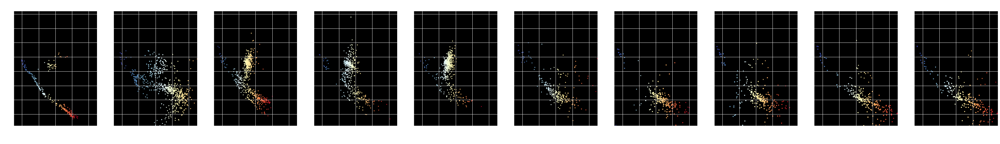

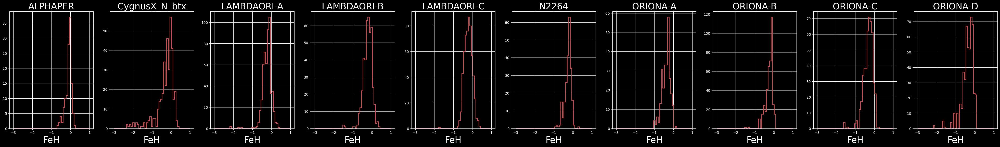

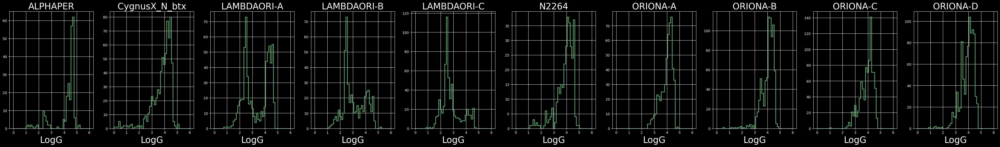

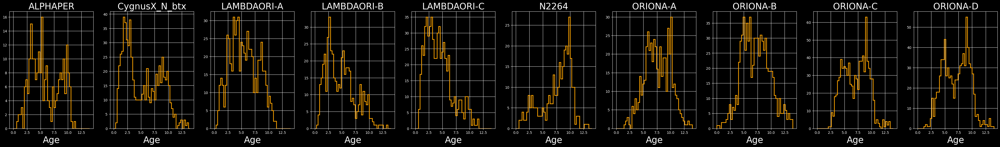

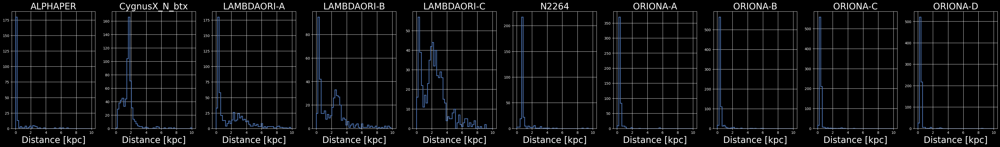

...

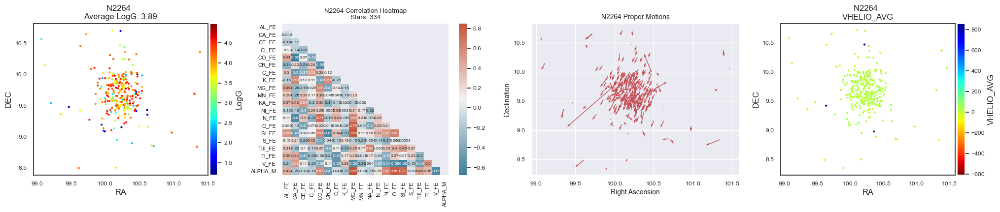

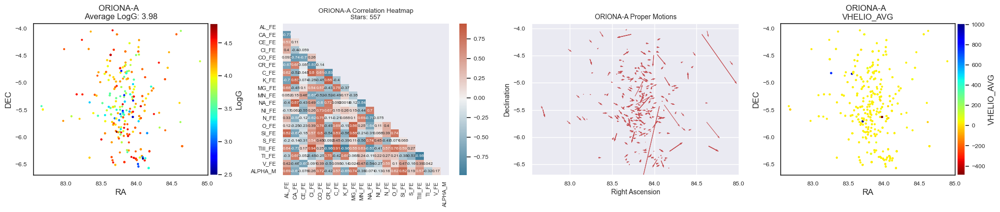

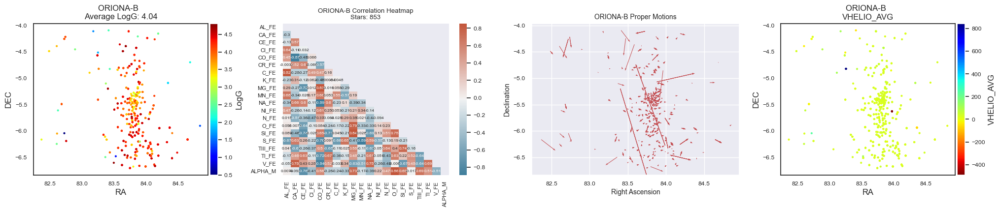

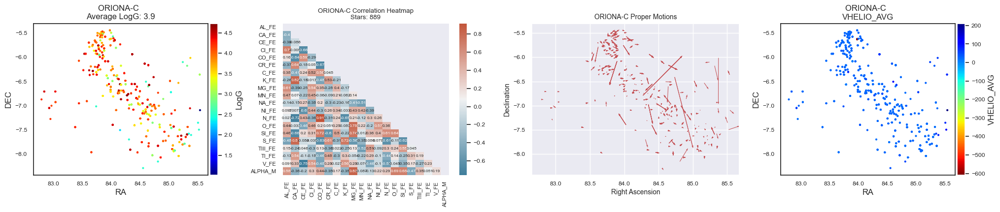

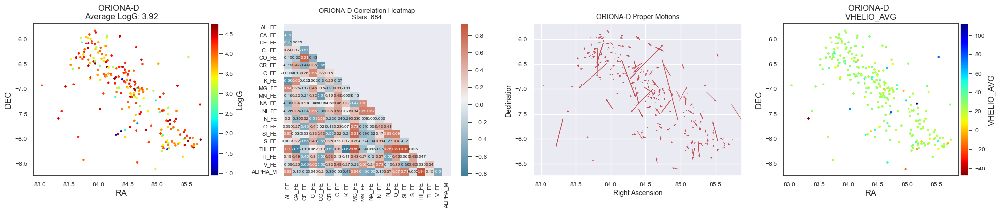

Done!


In [122]:
fields_list = unique_fields[0:10]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
#Plot_MG_FE_vs_AL_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
#Plot_N_FE_vs_AL_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
#Plot_N_FE_vs_C_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

['ORIONA-E' 'ORIONB-A' 'ORIONB-B' 'ORIONOB1AB-A' 'ORIONOB1AB-B'
 'ORIONOB1AB-C' 'ORIONOB1AB-D' 'ORIONOB1AB-E' 'ORIONOB1AB-F' 'PLEIADES-E']


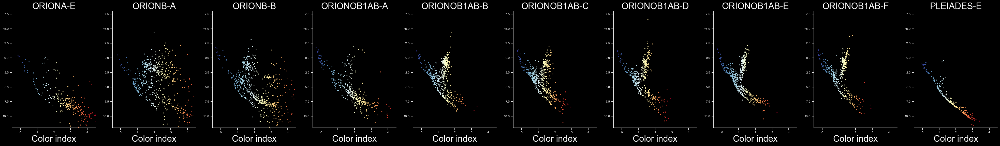

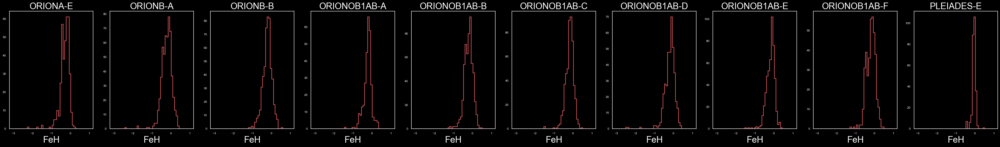

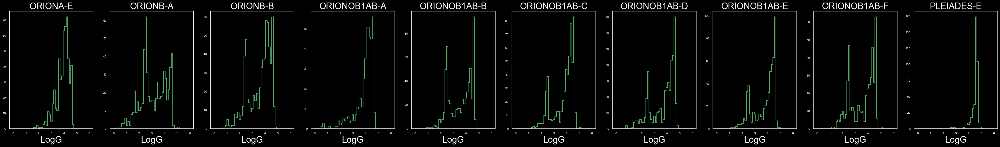

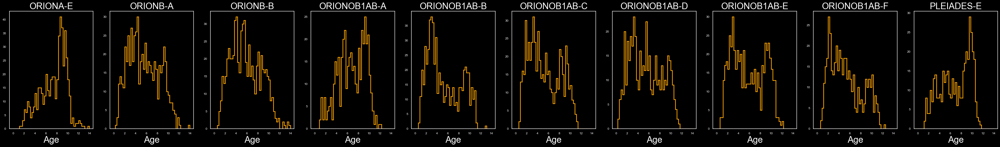

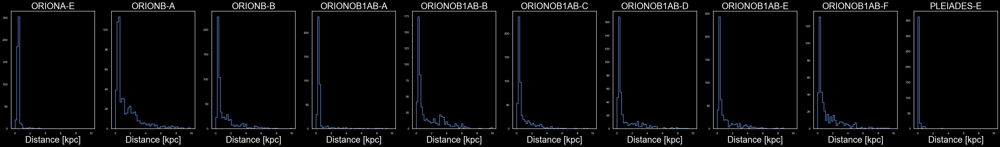

...

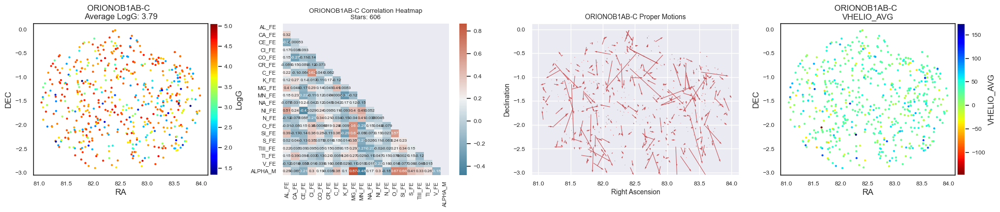

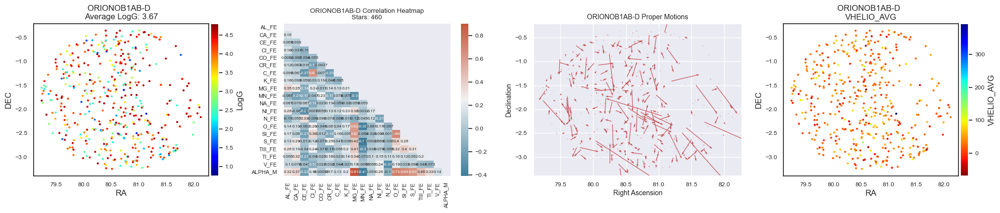

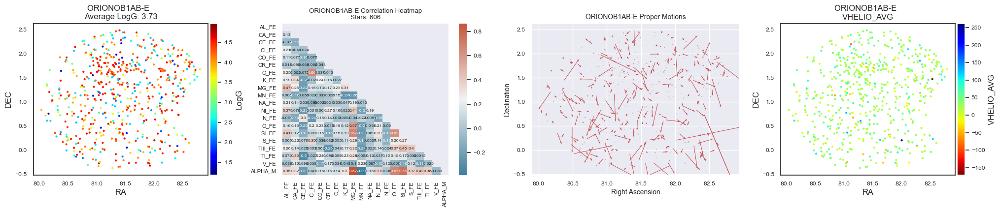

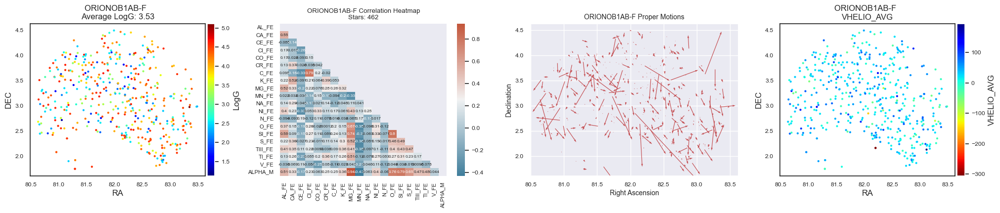

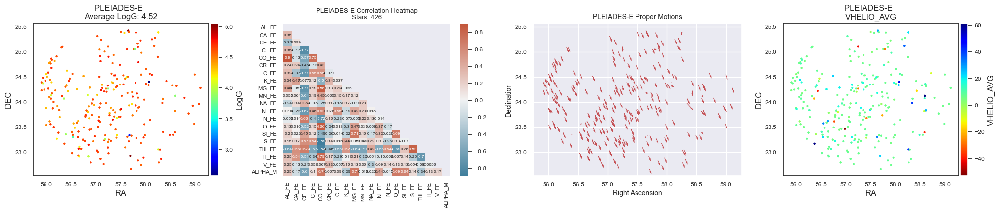

Done!


In [123]:
fields_list = unique_fields[10:20]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
#Plot_MG_FE_vs_AL_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
#Plot_N_FE_vs_AL_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
#Plot_N_FE_vs_C_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)

Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

['ORIONOB1AB-D' 'ORIONOB1AB-E' 'ORIONOB1AB-F' 'PLEIADES-E' 'PLEIADES-W'
 'Rosette_btx' 'TAUL1495' 'TAUL1521' 'TAUL1527' 'TAUL1536']


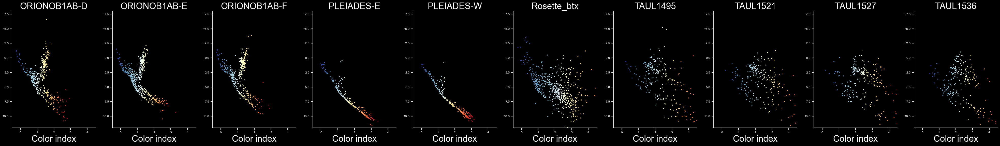

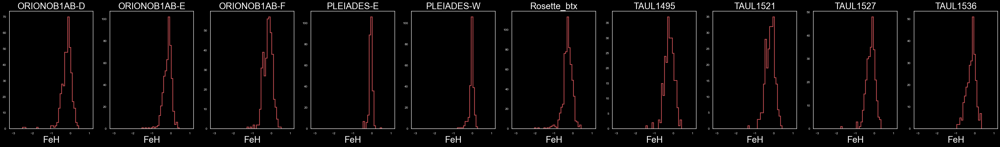

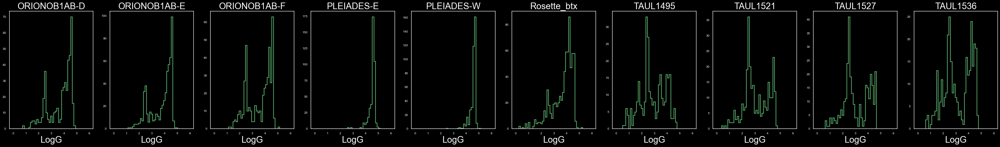

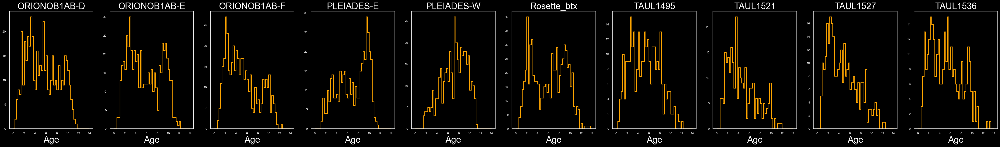

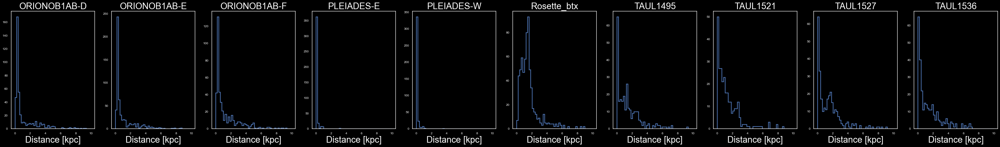

...

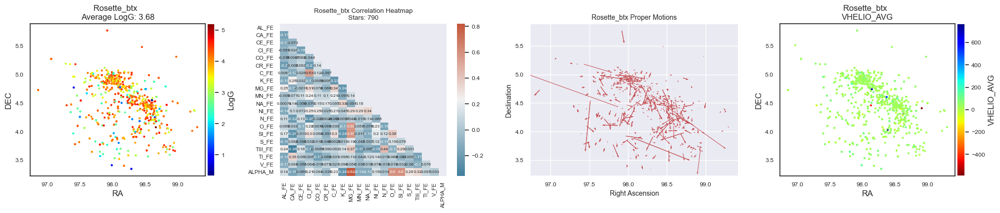

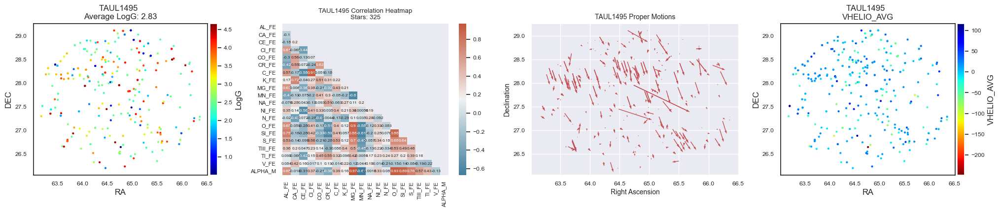

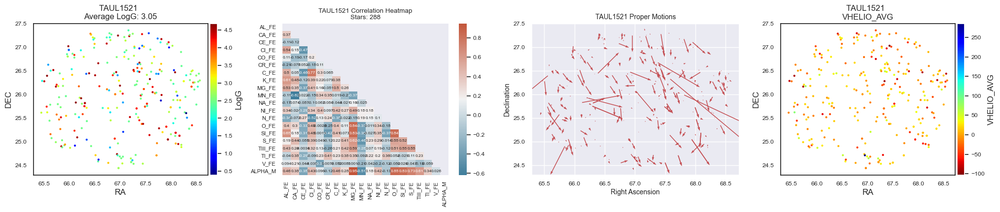

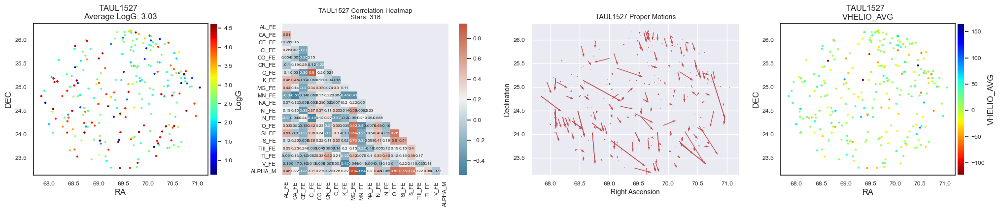

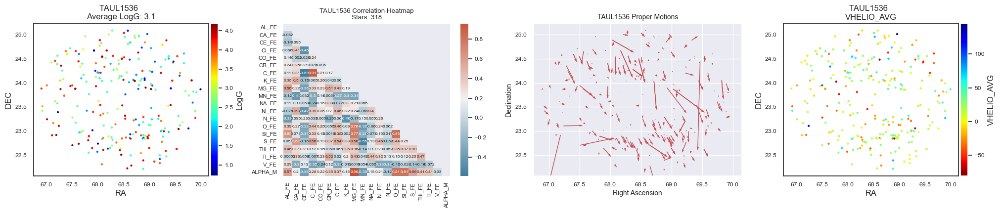

Done!


In [125]:
fields_list = unique_fields[16:26]  # <--- Note change fron 20:30 to 15:25, since there are only 25 gc fields, static code restriction, to maintain 10 star fields per field list 

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
#Plot_MG_FE_vs_AL_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
#Plot_N_FE_vs_AL_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
#Plot_N_FE_vs_C_FE(fields_list,-0.5, 0.6, -0.9, 0.6)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

In [ ]:
fields_list = unique_fields[26:36]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

In [ ]:
fields_list = unique_fields[40:50]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

In [ ]:
fields_list = unique_fields[50:60]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

In [ ]:
fields_list = unique_fields[60:70]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

In [ ]:
fields_list = unique_fields[70:80]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

In [ ]:
fields_list = unique_fields[80:90]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

In [ ]:
fields_list = unique_fields[90:100]

print(fields_list)

print_hr_details_flag = "N"

Plot_HR_Diagram(fields_list,-0.5, 4.5, -8, 12)
Plot_Feh(fields_list,-0.5, 4.5, -8, 12)
Plot_LogG(fields_list,-0.5, 4.5, -8, 12)
Plot_Age(fields_list,-0.5, 4.5, -8, 12)
Plot_Distance(fields_list,0, 10, -8, 12)
Plot_Alpha_Elements(fields_list,-0.5, 4.5, -8, 12)
Plot_Proper_Motion(fields_list,-0.5, 4.5, -5, 13)

if print_hr_details_flag == "Y":
    HR_Details(fields_list)

print("Done!")

In [ ]:
def AbundanceCategories(x1):
    main_sequence = x1[x1['LOGG'].astype(float) > 4.20]
    turnoff       = x1[(x1['LOGG'].astype(float) < 4.20) & (x1['LOGG'].astype(float) > 3.90)]
    subgiants     = x1[(x1['LOGG'].astype(float) < 3.90) & (x1['LOGG'].astype(float) > 3.60)]
    red_giants    = x1[x1['LOGG'].astype(float) < 3.60]
    
    print("main_sequence: " + str(main_sequence.shape[0]))
    print("turnoff: " + str(turnoff.shape[0]))
    print("subgiants: " + str(subgiants.shape[0]))
    print("red_giants: " + str(red_giants.shape[0]))

In [ ]:
def Plot_Categories(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):

            f1 = df2[df2['LOGG'] > -9999]

            f1['Star_Type'] = ""
            f1['Star_Type'] = np.where(f1[f1['LOGG'].astype(float) > 4.20], 'main_sequence', f1['Star_Type'])
            f1['Star_Type'] = np.where(f1[(f1['LOGG'].astype(float) < 4.20) & (f1['LOGG'].astype(float) > 3.90)], 'turnoff', f1['Star_Type'])
            f1['Star_Type'] = np.where(f1[(f1['LOGG'].astype(float) < 3.90) & (f1['LOGG'].astype(float) > 3.60)], 'subgiants', f1['Star_Type'])
            f1['Star_Type'] = np.where(f1[f1['LOGG'].astype(float) < 3.60], 'red_giants', f1['Star_Type'])
            
            
            sns.set()
            #plt.style.use('dark_background')
    
            ax.sns.countplot(x = 'Star_Type', palette = 'cool', data = f1)
            
    plt.show()

In [ ]:
Plot_Categories(fields_list,-0.5, 4.5, -8, 12)

In [ ]:
def Plot_MG_FE_vs_AL_FE(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):
            scatter_2D(df2['MG_FE'], df2['AL_FE'], ax=ax, 
                    c=df2['LOGG'], cmap='jet_r',)

            ax.set(title='Field: {}    Stars: [{}]'.format(label, len(df2)), 
                xlabel='MG_FE', 
                ylabel='AL_FE', 
                xlim=(xmin,xmax), ylim=(ymax,ymin))
                
            ax.set_title(str(label), fontsize=20)
            ax.set_xlabel('MG_FE', fontsize=18)
            ax.set_ylabel("AL_FE", fontsize=15)
            #ax.set_ylabel(None)

            #bar = fig.colorbar(image,orientation="vertical",pad=0.01)
            #bar.set_label("LogG",size=15)
            
    plt.show()

In [ ]:
def Plot_N_FE_vs_AL_FE(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):
            scatter_2D(df2['N_FE'], df2['AL_FE'], ax=ax, 
                    c=df2['LOGG'], cmap='jet_r',)

            ax.set(title='Field: {}    Stars: [{}]'.format(label, len(df2)), 
                xlabel='MG_FE', 
                ylabel='AL_FE', 
                xlim=(xmin,xmax), ylim=(ymax,ymin))
                
            ax.set_title(str(label), fontsize=20)
            ax.set_xlabel('N_FE', fontsize=18)
            ax.set_ylabel("AL_FE", fontsize=15)
            #ax.set_ylabel(None)

            #bar = fig.colorbar(image,orientation="vertical",pad=0.01)
            #bar.set_label("LogG",size=15)
            
    plt.show()

In [ ]:
def Plot_N_FE_vs_C_FE(fields_list,xmin, xmax, ymin, ymax):

    target1 = df_Apogee[df_Apogee['FIELD'] == fields_list[0]]
    target2 = df_Apogee[df_Apogee['FIELD'] == fields_list[1]]
    target3 = df_Apogee[df_Apogee['FIELD'] == fields_list[2]]
    target4 = df_Apogee[df_Apogee['FIELD'] == fields_list[3]]
    target5 = df_Apogee[df_Apogee['FIELD'] == fields_list[4]]
    target6 = df_Apogee[df_Apogee['FIELD'] == fields_list[5]]
    target7 = df_Apogee[df_Apogee['FIELD'] == fields_list[6]]
    target8 = df_Apogee[df_Apogee['FIELD'] == fields_list[7]]
    target9 = df_Apogee[df_Apogee['FIELD'] == fields_list[8]]
    target10 = df_Apogee[df_Apogee['FIELD'] == fields_list[9]]

    sptype_len_list = [target1, target2, target3, target4, target5, target6, target7, target8, target9, target10]
    sptype_list = fields_list[0:len(fields_list)]

    plt.close()

    with plt.style.context('dark_background'):

        fig, axs = plt.subplots(1,10, figsize=(50,6))
        for df2, label, ax in zip(sptype_len_list, sptype_list, axs.reshape(-1)):
            scatter_2D(df2['N_FE'], df2['C_FE'], ax=ax, 
                    c=df2['LOGG'], cmap='jet_r',)

            ax.set(title='Field: {}    Stars: [{}]'.format(label, len(df2)), 
                xlabel='MG_FE', 
                ylabel='AL_FE', 
                xlim=(xmin,xmax), ylim=(ymax,ymin))
                
            ax.set_title(str(label), fontsize=20)
            ax.set_xlabel('N_FE', fontsize=18)
            ax.set_ylabel("C_FE", fontsize=15)
            #ax.set_ylabel(None)

            #bar = fig.colorbar(image,orientation="vertical",pad=0.01)
            #bar.set_label("LogG",size=15)
            
    plt.show()

In [ ]:
s1 = df_Apogee

print('Stars: '   + str(s1.shape[0]))

BA1 = s1[s1['ASPCAP_GRID'].isin(['BA'])]
Fd1 = s1[s1['ASPCAP_GRID'].isin(['Fd_a', 'Fd_b', 'Fd_c', 'Fd_d'])]
GKd1 = s1[s1['ASPCAP_GRID'].isin(['GKd_a', 'GKd_b', 'GKd_c', 'GKd_d'])]
GKg1 = s1[s1['ASPCAP_GRID'].isin(['GKg_a', 'GKg_b', 'GKg_c', 'GKg_d'])]
Md1 = s1[s1['ASPCAP_GRID'].isin(['Md_a', 'Md_b', 'Md_c', 'Md_d'])]
Mg1 = s1[s1['ASPCAP_GRID'].isin(['Mg_a', 'Mg_b', 'Mg_c', 'Mg_d'])]

print("\nBA " + str(BA1.shape[0]))
print("Fd: " + str(Fd1.shape[0]))
print("GKd: " + str(GKd1.shape[0]))
print("GKg: " + str(GKg1.shape[0]))
print("Md: " + str(Md1.shape[0]))
print("Mg: " + str(Mg1.shape[0]))

In [ ]:
s1 = df_Apogee

idx_BA  = sp.where( (s1['ASPCAP_GRID'] == 'BA') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx_Fd_a = sp.where( (s1['ASPCAP_GRID'] == 'Fd_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_b = sp.where( (s1['ASPCAP_GRID'] == 'Fd_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_c = sp.where( (s1['ASPCAP_GRID'] == 'Fd_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Fd_d = sp.where( (s1['ASPCAP_GRID'] == 'Fd_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx_GKd_a = sp.where( (s1['ASPCAP_GRID'] == 'GKd_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_b = sp.where( (s1['ASPCAP_GRID'] == 'GKd_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_c = sp.where( (s1['ASPCAP_GRID'] == 'GKd_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKd_d = sp. where( (s1['ASPCAP_GRID'] == 'GKd_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx_GKg_a = sp.where( (s1['ASPCAP_GRID'] == 'GKg_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_b = sp.where( (s1['ASPCAP_GRID'] == 'GKg_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_c = sp.where( (s1['ASPCAP_GRID'] == 'GKg_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_GKg_d = sp.where( (s1['ASPCAP_GRID'] == 'GKg_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx_Md_b = sp.where( (s1['ASPCAP_GRID'] == 'Md_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_c = sp.where( (s1['ASPCAP_GRID'] == 'Md_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_d = sp.where( (s1['ASPCAP_GRID'] == 'Md_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Md_a = sp.where( (s1['ASPCAP_GRID'] == 'Md_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

idx_Mg_a = sp.where( (s1['ASPCAP_GRID'] == 'Mg_a') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_b = sp.where( (s1['ASPCAP_GRID'] == 'Mg_b') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_c = sp.where( (s1['ASPCAP_GRID'] == 'Mg_c') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]
idx_Mg_d = sp.where( (s1['ASPCAP_GRID'] == 'Mg_d') & sp.logical_not (s1['APOGEE_TARGET2'] & 2**9))[0]

s1Label = "All"

print('\n' + s1Label + ': Stars '   + str(s1.shape[0]))

print('\nBA' + ': Stars '   + str(idx_BA.shape[0]))

print('\nFd_a' + ': Stars '   + str(idx_Fd_a.shape[0]))
print('Fd_b' + ': Stars '     + str(idx_Fd_b.shape[0]))
print('Fd_c' + ': Stars '     + str(idx_Fd_c.shape[0]))
print('Fd_d' + ': Stars '     + str(idx_Fd_d.shape[0]))


print('\nGKd_a' + ': Stars '   + str(idx_GKd_a.shape[0]))
print('GKd_b' + ': Stars '     + str(idx_GKd_b.shape[0]))
print('GKd_c' + ': Stars '     + str(idx_GKd_c.shape[0]))
print('GKd_d' + ': Stars '     + str(idx_GKd_d.shape[0]))


print('\nGKg_a' + ': Stars '   + str(idx_GKg_a.shape[0]))
print('GKg_b' + ': Stars '     + str(idx_GKg_b.shape[0]))
print('GKg_c' + ': Stars '     + str(idx_GKg_c.shape[0]))
print('GKg_d' + ': Stars '     + str(idx_GKg_d.shape[0]))


print('\nMd_a' + ': Stars '   + str(idx_Md_a.shape[0]))
print('Md_b' + ': Stars '     + str(idx_Md_b.shape[0]))
print('Md_c' + ': Stars '     + str(idx_Md_c.shape[0]))
print('Md_d' + ': Stars '     + str(idx_Md_d.shape[0]))


print('\nMg_a' + ': Stars '   + str(idx_Mg_a.shape[0]))
print('Mg_b' + ': Stars '     + str(idx_Mg_b.shape[0]))
print('Mg_c' + ': Stars '     + str(idx_Mg_c.shape[0]))
print('Mg_d' + ': Stars '     + str(idx_Mg_d.shape[0]))